In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('../3 - Cleaning & Transforming Data/2 cleaned_dataset_MERGED_DRUG(Mogran)_ALLELESEQ.csv',index_col=None)

In [3]:
def show_corrgraph(df_corr,name,annot,size,fontsize,allside):
    #plt.figure(figsize=(16, 16))
    plt.figure(figsize=size)
    ax = sns.heatmap(df_corr.corr(), cmap='RdBu', vmin=-1, vmax=1,xticklabels=df_corr.columns, yticklabels=df_corr.columns,annot=annot)
    if allside == True:
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90,fontsize = fontsize)    
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0,fontsize = fontsize)
    ax.tick_params(right = False, top=True,labelright=False,labeltop=True)
    plt.title(name,fontsize=fontsize)
    plt.savefig(f'{name}.png')
    print(f"saved{name}")

In [4]:
df2 = df.drop(columns=(['ADR','Cohort ethnicity']+df.iloc[:,14:].columns.tolist())).copy()

In [5]:
df2 = pd.get_dummies(df2, columns=['Drug','Allele'])

In [6]:
df2

,ADR_MPexanthema,ADR_SJS,ADR_TEN,Cohort ethnicity_Black,Cohort ethnicity_Caucasian,Cohort ethnicity_Diverse,Cohort ethnicity_Mongol,No_ADR,Yes_ADR,0,...,Allele_B*81:01,Allele_C*03:03,Allele_C*04:01,Allele_C*04:03,Allele_C*05:01,Allele_C*06:02,Allele_C*07:01,Allele_C*12:02,Allele_C*12:03,Allele_C*16:01
0,0,0,1,0,0,1,0,0,1.0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,0,1,0,0,1.0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,1,0,0,1,0,0,1.0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,1,0,1.0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,1,0,1.0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13068,0,0,0,0,0,0,1,1,0.0,0,...,0,0,0,0,0,0,0,0,0,0
13069,0,0,0,0,0,0,1,1,0.0,0,...,0,0,0,0,0,0,0,0,0,0
13070,0,0,0,0,0,0,1,1,0.0,0,...,0,0,0,0,0,0,0,0,0,0
13071,0,0,0,0,0,0,1,1,0.0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
df2.rename(columns={'No_ADR':'ADR_Yes','Yes_ADR':'ADR_No'},inplace=True)

In [8]:
show_corrgraph(df2,'Correlation of all features',False,(100,100),40,True)

savedCorrelation of all features


In [9]:
adr_col = [x for x in df2.columns if 'ADR' in x]
race_col = [x for x in df2.columns if 'Cohort' in x]
allele_col = [x for x in df2.columns if 'Allele' in x]
drug_col = [x for x in df2.columns if 'Drug' in x]


savedADR Correlations


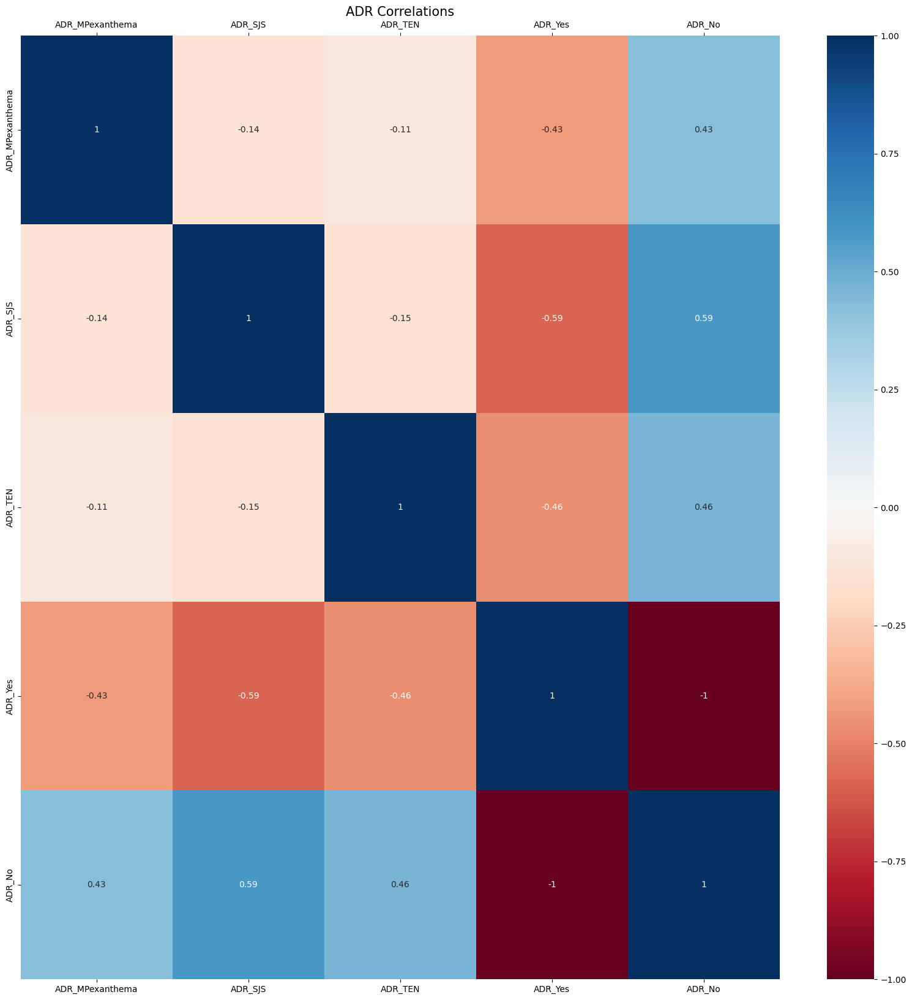

In [10]:
show_corrgraph(df2[adr_col],'ADR Correlations',True,(20,20),15,False)

savedRace Correlations


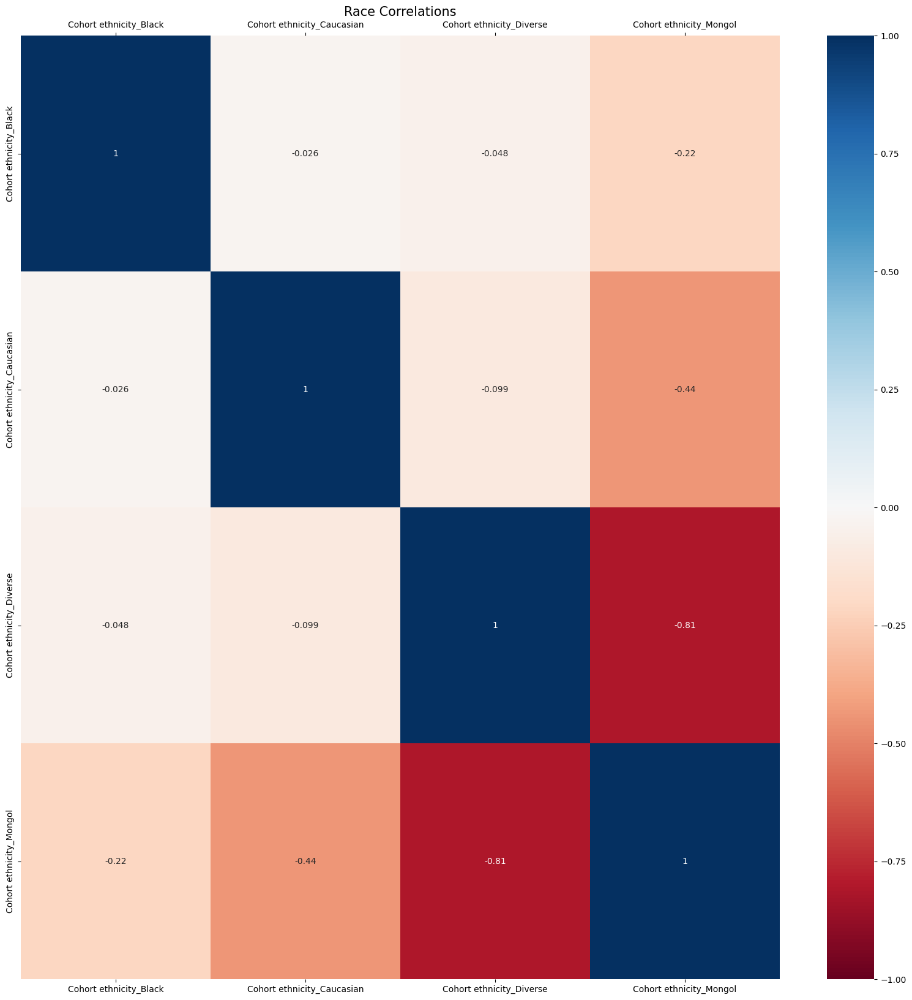

In [11]:
show_corrgraph(df2[race_col],'Race Correlations',True,(20,20),15,False)

savedDrug Correlations


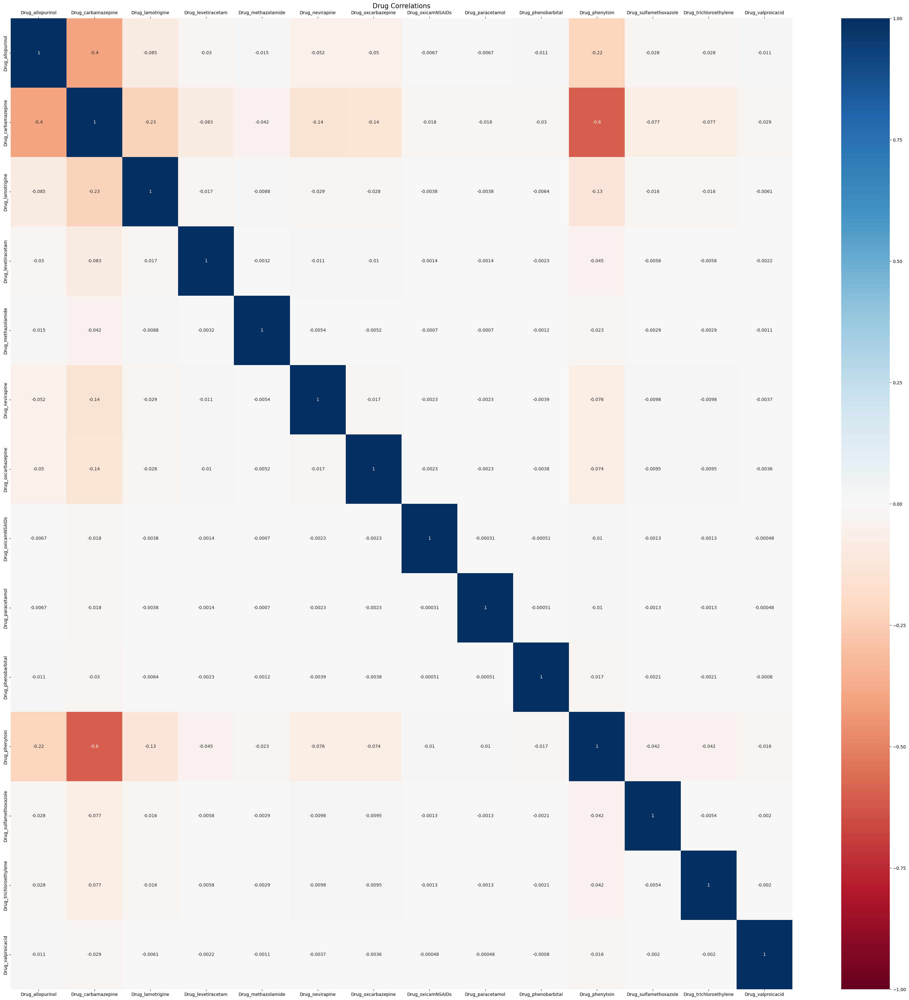

In [12]:
show_corrgraph(df2[drug_col],'Drug Correlations',True,(40,40),15,False)

In [13]:
show_corrgraph(df2[allele_col],'Allele Correlations',False,(100,100),40,True)

savedAllele Correlations


In [14]:
show_corrgraph(df2[allele_col + drug_col],'Allele and Drug Correlations',False,(100,100),35,True)

savedAllele and Drug Correlations


In [15]:
show_corrgraph(df2[allele_col + race_col],'Allele and Race Correlations',False,(100,100),35,True)

savedAllele and Race Correlations


savedDrug and ADR Correlations


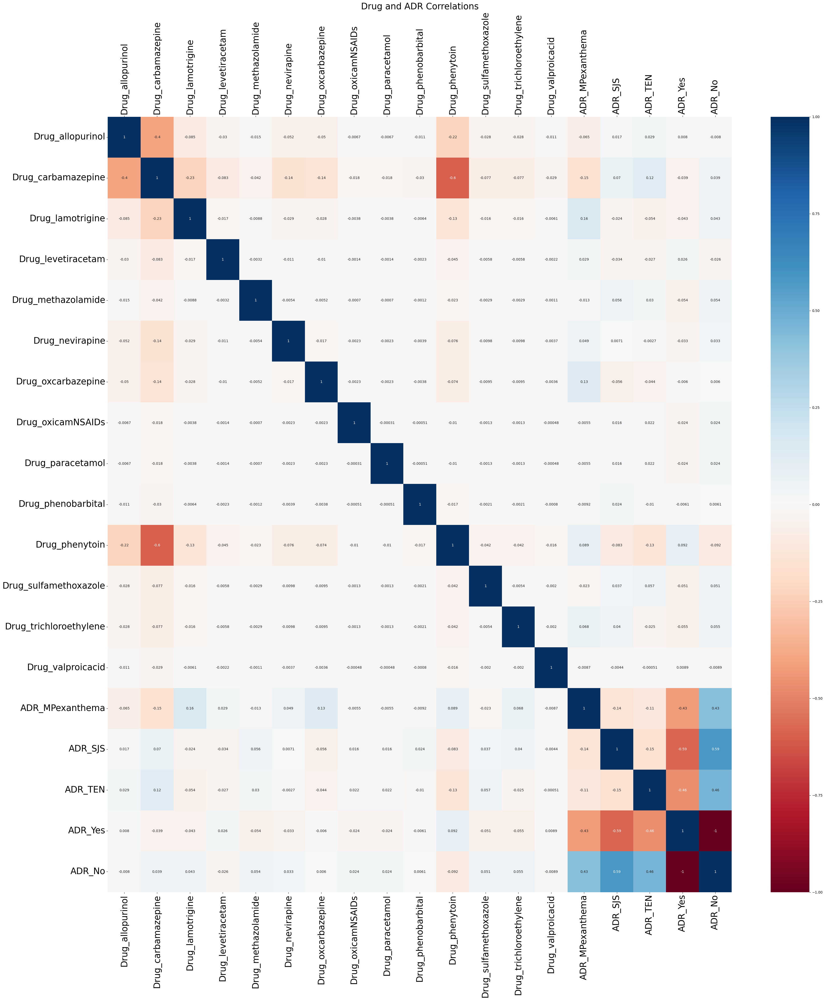

In [16]:
show_corrgraph(df2[drug_col + adr_col],'Drug and ADR Correlations',True,(40,40),25,True)